In [3]:
!pwd

/DATA5T/Developer/3DObject


In [5]:
!ls /DATA5T/Developer/3DObject/Open3D/examples/python/

__init__.py  geometry		      misc		     utility
__pycache__  gui		      open3d_tutorial.py     visualization
benchmark    jupyter_run_all.py       pipelines
core	     jupyter_strip_output.py  reconstruction_system


In [3]:
import open3d as o3d
pcd = o3d.geometry.PointCloud()

In [5]:
vis = open3d.visualization.Visualizer()

In [6]:
import open3d as o3d
import numpy as np
import os
import sys

# monkey patches visualization and provides helpers to load geometries
#sys.path.append('..')
sys.path.append('/DATA5T/Developer/3DObject/Open3D/examples/python/')
import open3d_tutorial as o3dtut
# change to True if you want to interact with the visualization windows
o3dtut.interactive = not "CI" in os.environ

# Visualization
## Function draw_geometries
Open3D provides a convenient visualization function `draw_geometries` which takes a list of geometry objects (`PointCloud`, `TriangleMesh`, or `Image`), and renders them together. We have implemented many functions in the visualizer, such as rotation, translation, and scaling via mouse operations, changing rendering style, and screen capture. Press `H` inside the window to print out a comprehensive list of functions.

In [9]:
!ls /DATA5T/Datasets/MyDepth

1_Cloud_.png	       2_ZED_image_left.png   realsenseL_Depth.png
1_Depth_.ply	       2_ZED_image_right.png  realsenseL_Depth.raw
1_ZED_image_left.png   3_Cloud_.png	      realsenseL_Depth_metadata.csv
1_ZED_image_right.png  3_Depth_.ply	      realsenseply.ply
2_Cloud_.png	       3_ZED_image_left.png   realsenseply_nomesh.ply
2_Depth_.ply	       3_ZED_image_right.png


Load a ply point cloud, print it, and render it


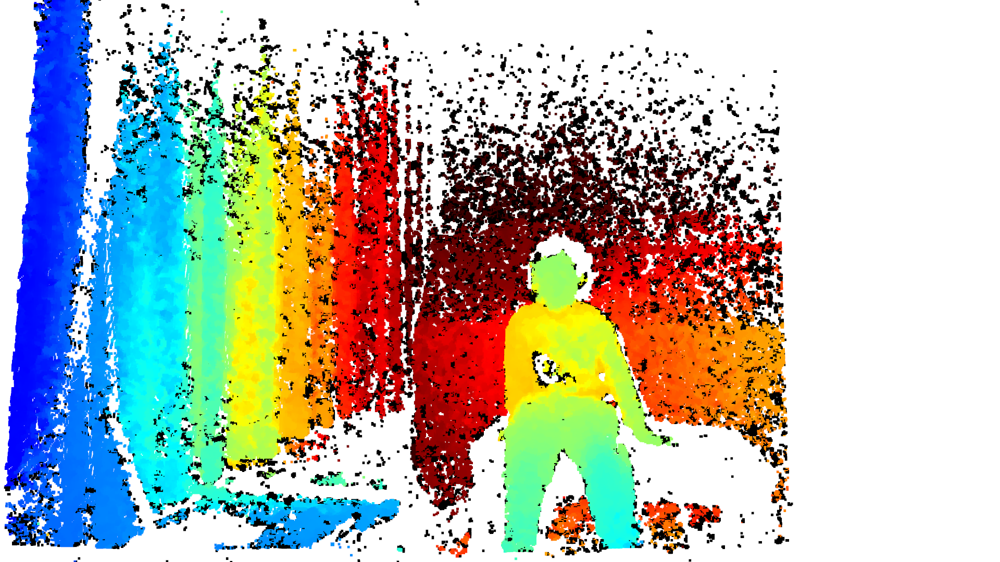

In [11]:
#Intel L515 data
print("Load a ply point cloud, print it, and render it")
pcd = o3d.io.read_point_cloud("/DATA5T/Datasets/MyDepth/realsenseply.ply") #"../../test_data/fragment.ply"
o3d.visualization.draw_geometries([pcd],
                                  zoom=0.3412)

Load a ply point cloud, print it, and render it


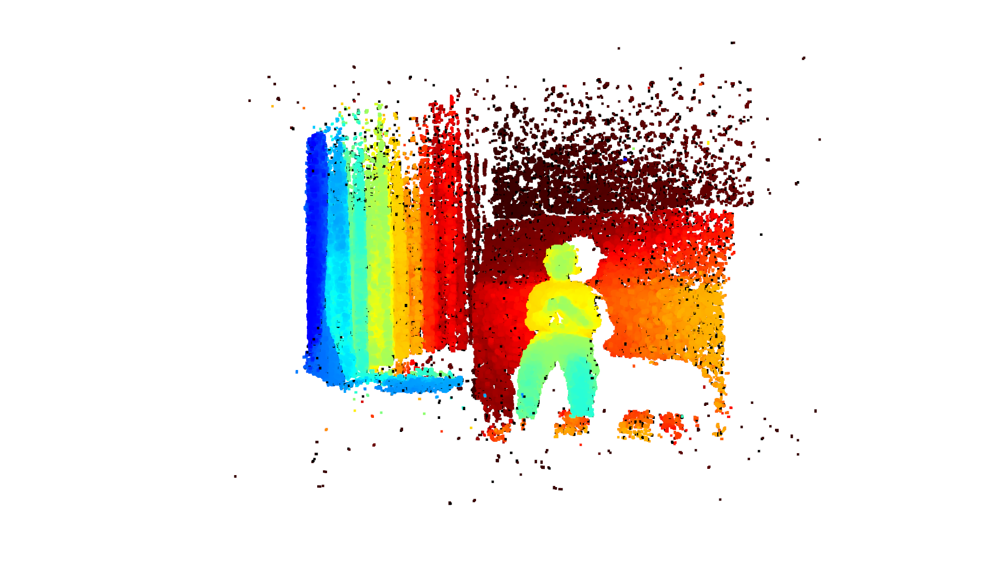

In [12]:
print("Load a ply point cloud, print it, and render it")
pcd = o3d.io.read_point_cloud("/DATA5T/Datasets/MyDepth/realsenseply_nomesh.ply") #"../../test_data/fragment.ply"
o3d.visualization.draw_geometries([pcd])

In [13]:
!ls /DATA5T/Developer/ZED/zed-opencv/python

Dataset0120a		    New2_1_ZED_image_right.jpg
Dataset0120b		    New2_2_Cloud.ply
Dataset0120c		    New2_2_Depth.png
Dataset0120d		    New2_2_ZED_image_left.jpg
Dataset0120e		    New2_2_ZED_image_right.jpg
Dataset0120f		    New2_3_Cloud.ply
Dataset0123a		    New2_3_Depth.png
New0_Cloud.ply		    New2_3_ZED_image_left.jpg
New0_Depth.png		    New2_3_ZED_image_right.jpg
New0_ZED_image_left.jpg     New2_Cloud.ply
New0_ZED_image_right.jpg    New2_Depth.png
New1_Cloud.ply		    New2_ZED_image_left.jpg
New1_Depth.png		    New2_ZED_image_right.jpg
New1_ZED_image_left.jpg     New3_Cloud.ply
New1_ZED_image_right.jpg    New3_Depth.png
New2_0_Cloud.ply	    New3_ZED_image_left.jpg
New2_0_Depth.png	    New3_ZED_image_right.jpg
New2_0_ZED_image_left.jpg   README.md
New2_0_ZED_image_right.jpg  core
New2_1_Cloud.ply	    realsense_recoder.py
New2_1_Depth.png	    realsense_test.py
New2_1_ZED_image_left.jpg   zed-opencv.py


Load a ply point cloud, print it, and render it
[Open3D WARNING] Read PLY failed: unable to read file: /DATA5T/Developer/ZED/zed-opencv/python/New2_3_Cloud.ply


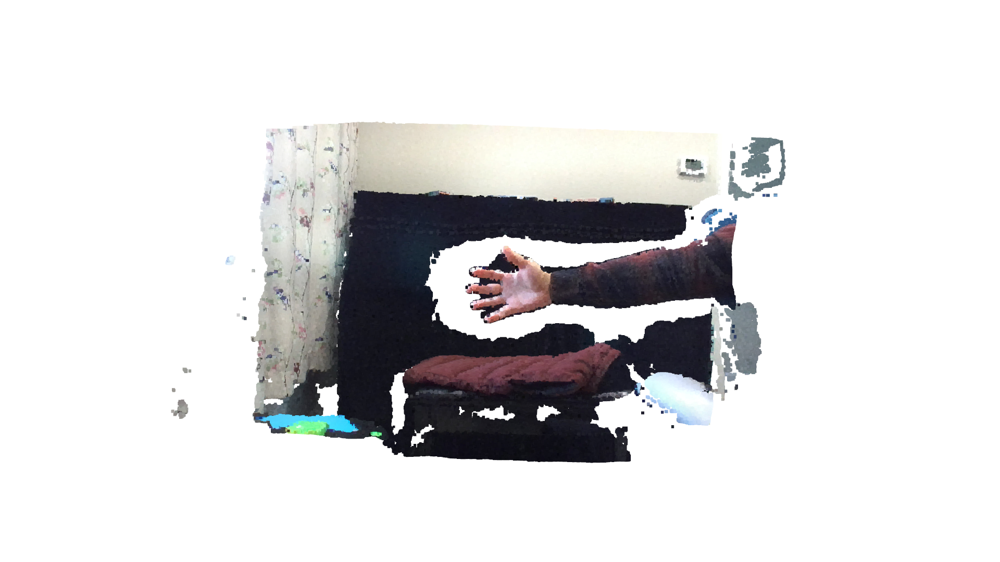

In [16]:
print("Load a ply point cloud, print it, and render it")
pcd = o3d.io.read_point_cloud("/DATA5T/Developer/ZED/zed-opencv/python/New2_3_Cloud.ply") #"../../test_data/fragment.ply"
o3d.visualization.draw_geometries([pcd],
                                 front=[0.4257, -0.2125, -0.8795], lookat=[2.6172, 2.0475, 1.532], up=[-0.0694, -0.9768, 0.2024])

```
-- Mouse view control --
  Left button + drag         : Rotate.
  Ctrl + left button + drag  : Translate.
  Wheel button + drag        : Translate.
  Shift + left button + drag : Roll.
  Wheel                      : Zoom in/out.

-- Keyboard view control --
  [/]          : Increase/decrease field of view.
  R            : Reset view point.
  Ctrl/Cmd + C : Copy current view status into the clipboard.
  Ctrl/Cmd + V : Paste view status from clipboard.

-- General control --
  Q, Esc       : Exit window.
  H            : Print help message.
  P, PrtScn    : Take a screen capture.
  D            : Take a depth capture.
  O            : Take a capture of current rendering settings.
```

<div class="alert alert-info">
    
**Note:** 

In some operating systems (e.g., macOS), the visualization window may not respond to keyboard input. This is usually because the console retains the input focus instead of passing it to the visualization window. Running with `pythonw` instead of `python` will resolve this issue.

</div>

<div class="alert alert-info">
    
**Note:** 

In addition to `draw_geometries`, Open3D has a set of sibling functions with more advanced functionality. `draw_geometries_with_custom_animation` allows the programmer to define a custom view trajectory and play an animation in the GUI. `draw_geometries_with_animation_callback` and `draw_geometries_with_key_callback` accept Python callback functions as input. The callback function is called in an automatic animation loop, or upon a key press event. See [Customized visualization](../visualization/customized_visualization.rst) for details.

</div>

## Store view point
In the beginning, the point cloud is rendered upside down.

![bad view](../../_static/visualization/visualization/badview.png)

After adjusting view points using `left-click + drag`, we can reach a better view point.

![color view](../../_static/visualization/visualization/color.png)

To retain this view point, press `Ctrl + C`. The view point will be translated into a json string stored in clipboard. When you move the camera to a different view, such as:

![new view](../../_static/visualization/visualization/newview.png)

You can get back to the original view by pressing `Ctrl + V`.

![color view](../../_static/visualization/visualization/color.png)

## Rendering styles
Open3D `Visualizer` supports several rendering styles. For example, pressing `L` will switch between a Phong lighting and a simple color rendering. Pressing `2` shows points colored based on their x-coordinate.

![colormap jet](../../_static/visualization/visualization/colormap_jet.png)

The color map can also be adjusted by, for example, pressing `Shift + 4`. This changes jet color map to hot color map.

![colormap hot](../../_static/visualization/visualization/colormap_hot.png)

# Depth Image

In [19]:
!ls /DATA5T/Developer/ZED/zed-opencv/python/Dataset0123a

depth  image2  image3  zed_intrinsics.json


In [20]:
!ls /DATA5T/Developer/ZED/zed-opencv/python/Dataset0123a/image2

000000.jpg  000004.jpg	000008.jpg  000012.jpg	000016.jpg
000001.jpg  000005.jpg	000009.jpg  000013.jpg	000017.jpg
000002.jpg  000006.jpg	000010.jpg  000014.jpg	000018.jpg
000003.jpg  000007.jpg	000011.jpg  000015.jpg


In [21]:
img = o3d.io.read_image("/DATA5T/Developer/ZED/zed-opencv/python/Dataset0123a/image2/000000.jpg")
print(img)

Image of size 1920x1080, with 3 channels.
Use numpy.asarray to access buffer data.


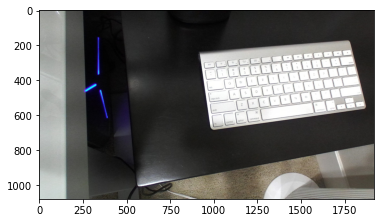

In [23]:
import matplotlib.pyplot as plt

imgplot = plt.imshow(img)

In [24]:
color_raw = o3d.io.read_image("/DATA5T/Developer/ZED/zed-opencv/python/Dataset0123a/image2/000000.jpg")
depth_raw = o3d.io.read_image("/DATA5T/Developer/ZED/zed-opencv/python/Dataset0123a/depth/000000.png")
rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
    color_raw, depth_raw)
print(rgbd_image)

RGBDImage of size 
Color image : 1920x1080, with 1 channels.
Depth image : 1920x1080, with 1 channels.
Use numpy.asarray to access buffer data.


In [25]:
print(rgbd_image.color)

Image of size 1920x1080, with 1 channels.
Use numpy.asarray to access buffer data.


In [26]:
print(color_raw)

Image of size 1920x1080, with 3 channels.
Use numpy.asarray to access buffer data.


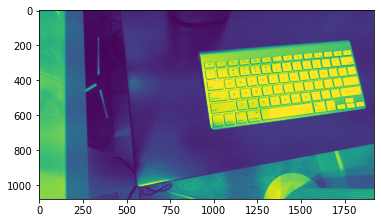

In [27]:
imgplot = plt.imshow(rgbd_image.color)

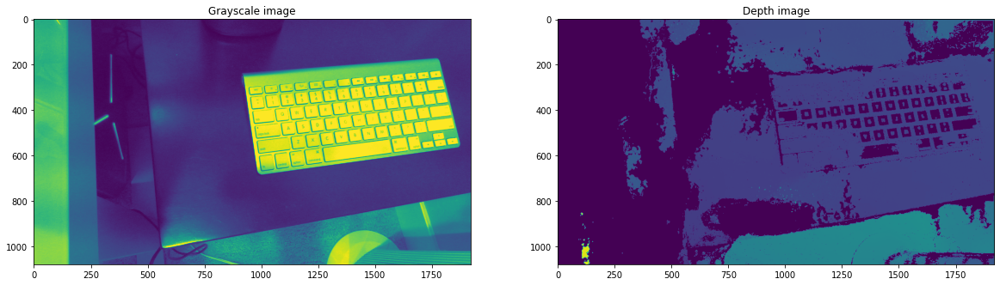

In [28]:
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('Grayscale image')
plt.imshow(rgbd_image.color)
plt.subplot(1, 2, 2)
plt.title('Depth image')
plt.imshow(rgbd_image.depth)
plt.show()

Focal length of the left eye in pixels, fx: 1414.021484375
Focal length of the left eye in pixels, fy: 1414.021484375
cx: 992.684814453125
cy: 527.5805053710938
First radial distortion coefficient, k1: 0.0
First radial distortion coefficient, k2: 0.0
Horizontal field of view of the left eye in degrees: 68.34833526611328

Open3D
Intrinsic camera matrix [[fx, 0, cx], [0, fy, cy], [0, 0, 1]] 

In [29]:
default=o3d.camera.PinholeCameraIntrinsic(o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

In [30]:
default.intrinsic_matrix

array([[525. ,   0. , 319.5],
       [  0. , 525. , 239.5],
       [  0. ,   0. ,   1. ]])

In [31]:
default

PinholeCameraIntrinsic with width = 640 and height = 480.
Access intrinsics with intrinsic_matrix.

In [32]:
fx=1414.02
fy=1414.02
cx=992.68
cy=527.58
img_width=960
img_height=540
pinholeCamera = o3d.camera.PinholeCameraIntrinsic(img_width, img_height, fx, fy, cx, cy)
pinholeCamera.intrinsic_matrix

array([[1.41402e+03, 0.00000e+00, 9.92680e+02],
       [0.00000e+00, 1.41402e+03, 5.27580e+02],
       [0.00000e+00, 0.00000e+00, 1.00000e+00]])

In [33]:
pinholeCamera.width #FullHD /2

960

In [34]:
pinholeCamera.height

540

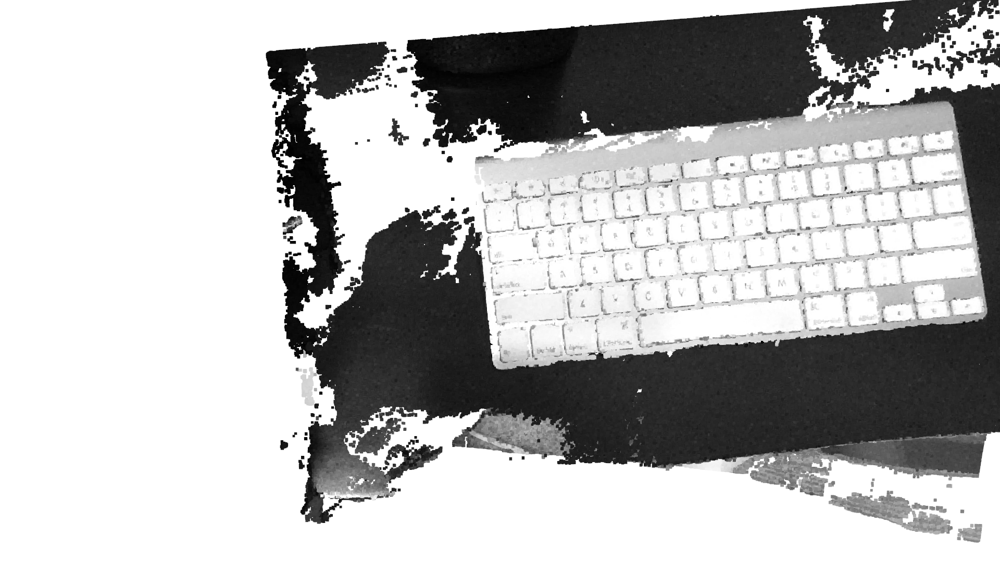

In [35]:
#ref: http://www.open3d.org/docs/release/python_api/open3d.geometry.PointCloud.html
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
    rgbd_image, pinholeCamera)
#     o3d.camera.PinholeCameraIntrinsic(
#         o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault))
# Flip it, otherwise the pointcloud will be upside down
pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
o3d.visualization.draw_geometries([pcd], zoom=0.5)

FullHD, did not cut the resolution/2
Focal length of the left eye in pixels, fx: 1414.362060546875
Focal length of the left eye in pixels, fy: 1414.362060546875
cx: 992.6983642578125
cy: 527.5966796875
First radial distortion coefficient, k1: 0.0
First radial distortion coefficient, k2: 0.0
Horizontal field of view of the left eye in degrees: 68.33551025390625
Image size half width:  1920
Image size half height:  1080

# Our own dataset
RGBD Odometry, ref:http://www.open3d.org/docs/latest/tutorial/Basic/rgbd_odometry.html

In [83]:
Root_path='/DATA5T/Developer/ZED/zed-opencv/python/Dataset0120e'
!ls $Root_path

depth  image2  image3  zed_intrinsics.json


Focal length of the left eye in pixels, fx: 1414.1348876953125
Focal length of the left eye in pixels, fy: 1414.1348876953125
cx: 992.7015380859375
cy: 527.6006469726562
First radial distortion coefficient, k1: 0.0
First radial distortion coefficient, k2: 0.0
Horizontal field of view of the left eye in degrees: 68.34406280517578


In [84]:
fx=1414.13
fy=1414.13
cx=992.70
cy=527.60
img_width=1920
img_height=1080
pinhole_camera_intrinsic = o3d.camera.PinholeCameraIntrinsic(img_width, img_height, fx, fy, cx, cy)
pinhole_camera_intrinsic.intrinsic_matrix

array([[1.41413e+03, 0.00000e+00, 9.92700e+02],
       [0.00000e+00, 1.41413e+03, 5.27600e+02],
       [0.00000e+00, 0.00000e+00, 1.00000e+00]])

In [85]:
pinhole_camera_intrinsic = o3d.io.read_pinhole_camera_intrinsic(Root_path+"/zed_intrinsics.json")
pinhole_camera_intrinsic.intrinsic_matrix

array([[1.41502905e+03, 0.00000000e+00, 9.92698486e+02],
       [0.00000000e+00, 1.41502905e+03, 5.27596558e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [86]:
pinhole_camera_intrinsic.width

1920

In [87]:
pinhole_camera_intrinsic.height

1080

In [88]:
source_color = o3d.io.read_image(Root_path+"/image2/"+"000003.jpg")
source_depth = o3d.io.read_image(Root_path+"/depth/"+"000003.png")
target_color = o3d.io.read_image(Root_path+"/image2/"+"000004.jpg")
target_depth = o3d.io.read_image(Root_path+"/depth/"+"000004.png")
source_rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
    source_color, source_depth)
target_rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
    target_color, target_depth)
target_pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
    target_rgbd_image, pinhole_camera_intrinsic)
source_pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
    source_rgbd_image, pinhole_camera_intrinsic)

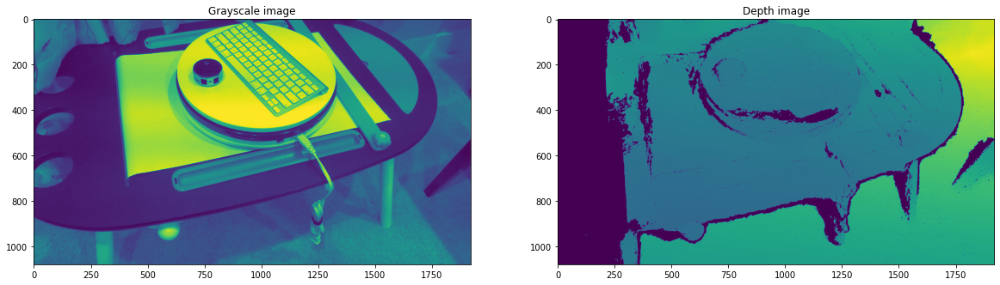

In [89]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('Grayscale image')
plt.imshow(source_rgbd_image.color)
plt.subplot(1, 2, 2)
plt.title('Depth image')
plt.imshow(source_rgbd_image.depth)
plt.show()

In [90]:
#Compute odometry from two RGBD image pairs
option = o3d.pipelines.odometry.OdometryOption()
odo_init = np.identity(4)
#option.max_depth = 0.5
option.max_depth_diff = 0.15
print(option)

[success_color_term, trans_color_term,
 info] = o3d.pipelines.odometry.compute_rgbd_odometry(
     source_rgbd_image, target_rgbd_image, pinhole_camera_intrinsic, odo_init,
     o3d.pipelines.odometry.RGBDOdometryJacobianFromColorTerm(), option)
#It minimizes photo consistency of aligned images

[success_hybrid_term, trans_hybrid_term,
 info] = o3d.pipelines.odometry.compute_rgbd_odometry(
     source_rgbd_image, target_rgbd_image, pinhole_camera_intrinsic, odo_init,
     o3d.pipelines.odometry.RGBDOdometryJacobianFromHybridTerm(), option)
#In addition to photo consistency, it implements constraint for geometry, it is more accurate

OdometryOption class.
iteration_number_per_pyramid_level = [ 20, 10, 5, ] 
max_depth_diff = 0.150000
min_depth = 0.000000
max_depth = 4.000000


In [91]:
trans_color_term

array([[ 0.99217755,  0.01822032,  0.1234979 , -0.07199316],
       [-0.01702796,  0.99979772, -0.01070359,  0.02230266],
       [-0.12366794,  0.00851694,  0.99228711, -0.01004904],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [92]:
success_color_term

True

minimum_correspondence_ratio: After alignment, measure the overlapping ratio of two RGBD images. If overlapping region of two RGBD image is smaller than specified ratio, the odometry module regards that this is a failure case.

max_depth_diff: In depth image domain, if two aligned pixels have a depth difference less than specified value, they are considered as a correspondence. Larger value induce more aggressive search, but it is prone to unstable result.

min_depth and max_depth: Pixels that has smaller or larger than specified depth values are ignored.


The RGBD image pairs are converted into point clouds and rendered together. Note that the point cloud representing the first (source) RGBD image is transformed with the transformation estimated by the odometry. After this transformation, both point clouds are aligned.

Using RGB-D Odometry
[[ 0.99217755  0.01822032  0.1234979  -0.07199316]
 [-0.01702796  0.99979772 -0.01070359  0.02230266]
 [-0.12366794  0.00851694  0.99228711 -0.01004904]
 [ 0.          0.          0.          1.        ]]


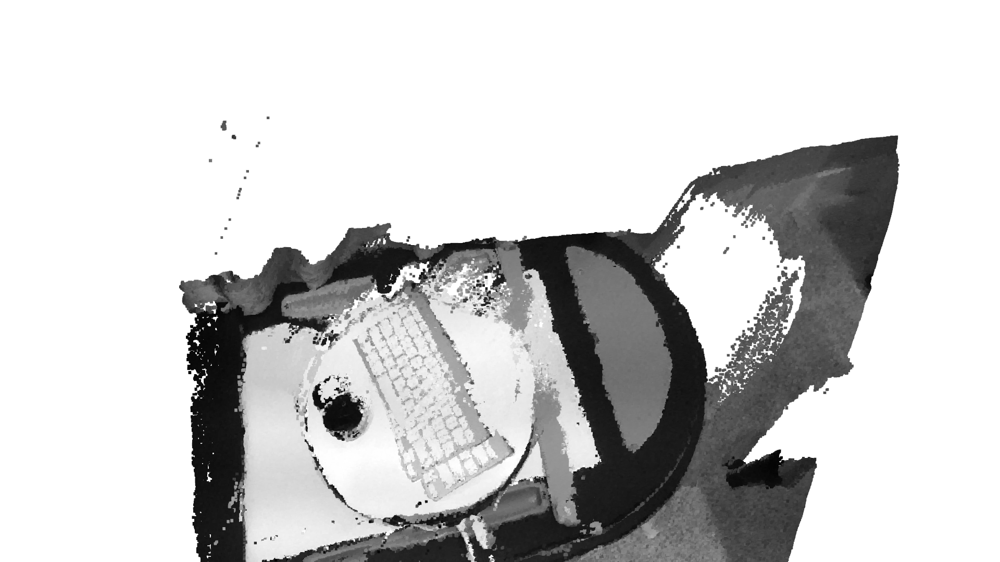

In [93]:
if success_color_term:
    print("Using RGB-D Odometry")
    print(trans_color_term)
    source_pcd_color_term = o3d.geometry.PointCloud.create_from_rgbd_image(
        source_rgbd_image, pinhole_camera_intrinsic)
    source_pcd_color_term.transform(trans_color_term)
    o3d.visualization.draw_geometries([target_pcd, source_pcd_color_term],
                                      zoom=0.48,
                                      front=[0.0999, -0.1787, -0.9788],
                                      lookat=[0.0345, -0.0937, 1.8033],
                                      up=[-0.0067, -0.9838, 0.1790])

Using Hybrid RGB-D Odometry
[[ 0.99904608  0.0088357   0.04276506  0.00300903]
 [-0.00771175  0.99962235 -0.0263759   0.04264258]
 [-0.04298196  0.02602094  0.99873693 -0.02460346]
 [ 0.          0.          0.          1.        ]]


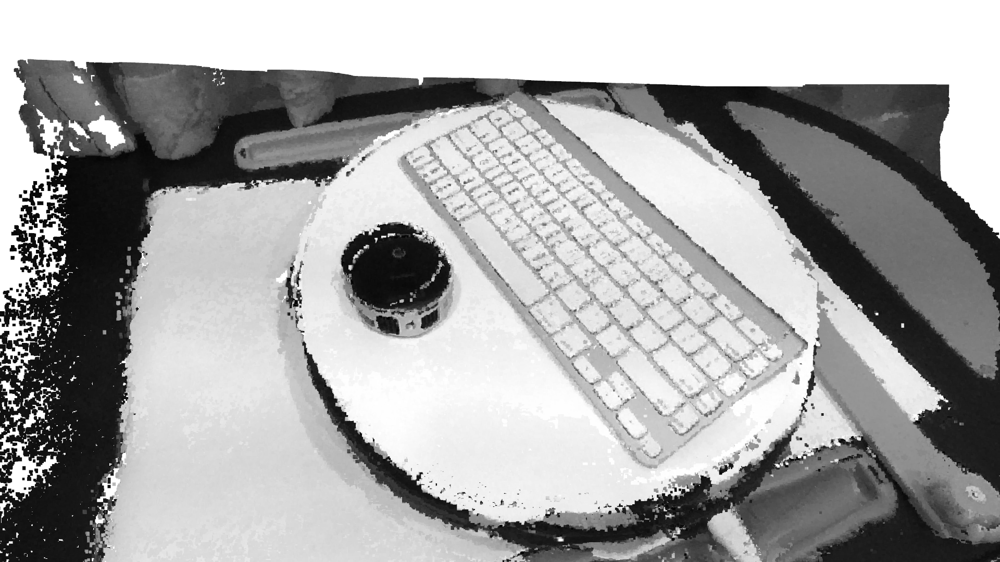

In [94]:
if success_hybrid_term:
    print("Using Hybrid RGB-D Odometry")
    print(trans_hybrid_term)
    source_pcd_hybrid_term = o3d.geometry.PointCloud.create_from_rgbd_image(
        source_rgbd_image, pinhole_camera_intrinsic)
    source_pcd_hybrid_term.transform(trans_hybrid_term)
    o3d.visualization.draw_geometries([target_pcd, source_pcd_hybrid_term],
                                      zoom=0.48,
                                      front=[0.0999, -0.1787, -0.9788],
                                      lookat=[0.0345, -0.0937, 1.8033],
                                      up=[-0.0067, -0.9838, 0.1790])

In [95]:
o3d.io.write_point_cloud("./desk.pcd", target_pcd)

True

In [96]:
import copy
def draw_registration_result(source, target, transformation):
    source_temp = copy.deepcopy(source)
    target_temp = copy.deepcopy(target)
    #source_temp.paint_uniform_color([1, 0.706, 0])
    #target_temp.paint_uniform_color([0, 0.651, 0.929])
    source_temp.transform(transformation)
    o3d.visualization.draw_geometries([source_temp, target_temp])

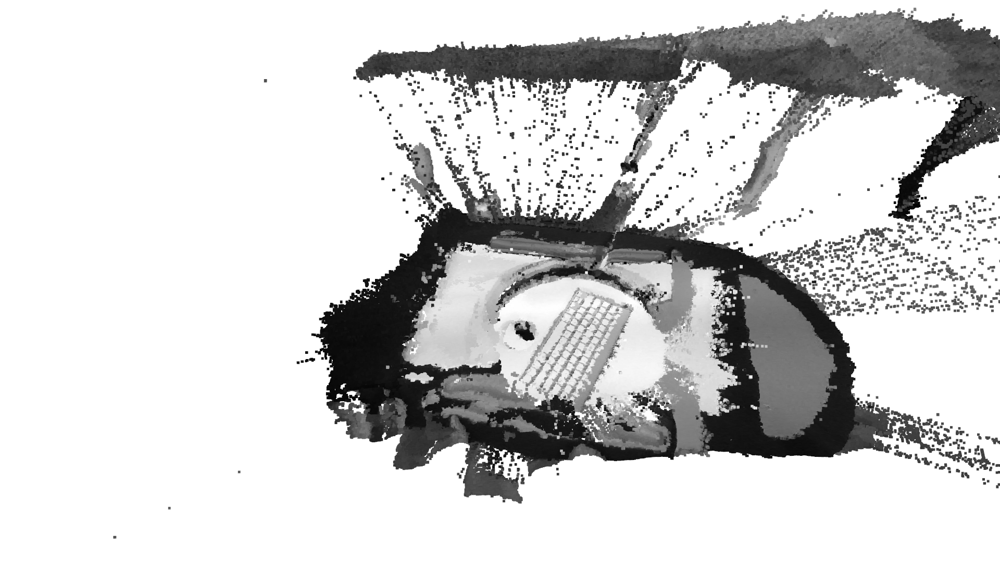

In [97]:
draw_registration_result(source_pcd_hybrid_term, target_pcd, trans_hybrid_term)

# try https://github.com/Ritchizh/RGBD-Integration-2020

In [149]:
!pwd

/DATA5T/Developer/3DObject/Open3D/examples/python/visualization


In [98]:
Root_path='/DATA5T/Developer/ZED/zed-opencv/python/Dataset0120e'
!ls $Root_path

depth  image2  image3  zed_intrinsics.json


In [99]:
import os

img_folder_path = Root_path+'/image2'
dirListing = os.listdir(img_folder_path)
num_Frames = len(dirListing)
print(num_Frames)

27


In [100]:
import open3d            as o3d
import numpy             as np
import matplotlib.pyplot as plt
plt.close('all')
pic_num = 1
#==============================================================================
#==============================================================================

skip_N_frames   = 1        # ! - Can choose the range of integrated Frames - less frames = faster run
frames_nums     = np.arange(3, 9, skip_N_frames)#np.arange(0, num_Frames, skip_N_frames)  

In [101]:
frames_nums

array([3, 4, 5, 6, 7, 8])

In [107]:
#  == ICP functions: ==

# check: http://www.open3d.org/docs/release/tutorial/Basic/icp_registration.html

# def draw_registration_result(source, target, transformation, title='Title'):
#     source_temp = source
#     target_temp = target
#     source_temp.paint_uniform_color([1, 0.706, 0])
#     target_temp.paint_uniform_color([0, 0.651, 0.929])
#     source_temp.transform(transformation)
#     o3d.visualization.draw_geometries([source_temp, target_temp], window_name=title)
    
def draw_registration_result(source, target, transformation):
    source_temp = copy.deepcopy(source)
    target_temp = copy.deepcopy(target)
#     source_temp.paint_uniform_color([1, 0.706, 0])
#     target_temp.paint_uniform_color([0, 0.651, 0.929])
    source_temp.transform(transformation)
#     o3d.visualization.draw_geometries([source_temp, target_temp],
#                                       zoom=0.4559,
#                                       front=[0.6452, -0.3036, -0.7011],
#                                       lookat=[1.9892, 2.0208, 1.8945],
#                                       up=[-0.2779, -0.9482, 0.1556])
    o3d.visualization.draw_geometries([source_temp, target_temp],
                                      zoom=0.48,
                                      front=[0.0999, -0.1787, -0.9788],
                                      lookat=[0.0345, -0.0937, 1.8033],
                                      up=[-0.0067, -0.9838, 0.1790])

#ref: http://www.open3d.org/docs/release/tutorial/pipelines/global_registration.html
#We downsample the point cloud, estimate normals, then compute a FPFH feature for each point. 
#The FPFH feature is a 33-dimensional vector that describes the local geometric property of a point. 
#A nearest neighbor query in the 33-dimensinal space can return points with similar local geometric structures.
def preprocess_point_cloud(pcd, voxel_size):
    print(":: Downsample with a voxel size %.3f." % voxel_size)
    pcd_down = pcd.voxel_down_sample(voxel_size)

    radius_normal = voxel_size * 2
    print(":: Estimate normal with search radius %.3f." % radius_normal)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))

    radius_feature = voxel_size * 5
    print(":: Compute FPFH feature with search radius %.3f." % radius_feature)
    pcd_fpfh = o3d.pipelines.registration.compute_fpfh_feature(
        pcd_down,
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_feature, max_nn=100))
    return pcd_down, pcd_fpfh

# def preprocess_point_cloud(pcd, voxel_size):
# #    print("\n- - Preprocessing - -\n:: Downsample with a voxel size %.3f." % voxel_size)
#     pcd_down = pcd.voxel_down_sample(voxel_size)

#     radius_normal = voxel_size * 2
# #    print(":: Estimate normal with search radius %.3f." % radius_normal)
#     pcd_down.estimate_normals(
#         o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))

#     radius_feature = voxel_size * 5
# #    print(":: Compute FPFH feature with search radius %.3f." % radius_feature)
#     pcd_fpfh = o3d.registration.compute_fpfh_feature(
#         pcd_down,
#         o3d.geometry.KDTreeSearchParamHybrid(radius=radius_feature, max_nn=100))
#     return pcd_down, pcd_fpfh

#ref: http://www.open3d.org/docs/latest/tutorial/Advanced/global_registration.html
def execute_global_registration(source_down, target_down, source_fpfh,
                                target_fpfh, voxel_size):
    distance_threshold = voxel_size * 1.5
    print(":: RANSAC registration on downsampled point clouds.")
    print("   Since the downsampling voxel size is %.3f," % voxel_size)
    print("   we use a liberal distance threshold %.3f." % distance_threshold)
    result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
        source_down, target_down, source_fpfh, target_fpfh, True,
        distance_threshold,
        o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
        3, [
            o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(
                0.9),
            o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(
                distance_threshold)
        ], o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 0.999))
    return result

# def execute_global_registration(source_down, target_down, source_fpfh,
#                                 target_fpfh, voxel_size):
#     distance_threshold = voxel_size * 1.5
#     print(":: RANSAC registration on downsampled point clouds.")
#     print("   Since the downsampling voxel size is %.3f," % voxel_size)
#     print("   we use a liberal distance threshold %.3f." % distance_threshold)
#     result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
#         source_down, target_down, source_fpfh, target_fpfh, distance_threshold,
#         o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
#         4, [
#             o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(
#                 0.9),
#             o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(
#                 distance_threshold)
#         ], o3d.pipelines.registration.RANSACConvergenceCriteria(4000000, 500))
#     return result

# def refine_registration(source, target, source_fpfh, target_fpfh, voxel_size):
#     distance_threshold = voxel_size * 0.4
#     print(":: Point-to-plane ICP registration is applied on original point")
#     print("   clouds to refine the alignment. This time we use a strict")
#     print("   distance threshold %.3f." % distance_threshold)
#     result = o3d.pipelines.registration.registration_icp(
#         source, target, distance_threshold, result_ransac.transformation,
#         o3d.pipelines.registration.TransformationEstimationPointToPlane())
#     return result

def refine_registration(source, target, voxel_size, result_ransac):
    distance_threshold = voxel_size * 0.4
#    print("\n - - Refine - -\n:: Point-to-plane ICP registration is applied on original point")
    radius_normal = voxel_size * 2
    source.estimate_normals(
    o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))
    target.estimate_normals(
    o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))
    result = o3d.pipelines.registration.registration_icp(
        source, target, distance_threshold, result_ransac.transformation,
        o3d.pipelines.registration.TransformationEstimationPointToPlane())
    return result

# def refine_registration(source, target, voxel_size):
#     distance_threshold = voxel_size * 0.4
# #    print("\n - - Refine - -\n:: Point-to-plane ICP registration is applied on original point")
#     radius_normal = voxel_size * 2
#     source.estimate_normals(
#     o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))
#     target.estimate_normals(
#     o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))
#     result = o3d.registration.registration_icp(
#         source, target, distance_threshold, result_ransac.transformation,
#         o3d.registration.TransformationEstimationPointToPlane())
#     return result


In [108]:

#==============================================================================
##=============##           TSDF PARAMETERS                  ##=============## 
#==============================================================================

voxel_size = 0.01  # means 1cm for this dataset
trunc       = np.inf  # Maximum depth limit. The Test depth frames were already truncated during Subject segmentation.
#==============================================================================
##=============##                 INTRINSICS                  ##=============## 
#==============================================================================

cameraIntrinsics = o3d.io.read_pinhole_camera_intrinsic(Root_path+"/zed_intrinsics.json")
cameraIntrinsics.intrinsic_matrix

array([[1.41502905e+03, 0.00000000e+00, 9.92698486e+02],
       [0.00000000e+00, 1.41502905e+03, 5.27596558e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [109]:
# examples/Python/Advanced/trajectory_io.py

import numpy as np


class CameraPose:

    def __init__(self, meta, mat):
        self.metadata = meta
        self.pose = mat

    def __str__(self):
        return 'Metadata : ' + ' '.join(map(str, self.metadata)) + '\n' + \
            "Pose : " + "\n" + np.array_str(self.pose)


def read_trajectory(filename):
    traj = []
    with open(filename, 'r') as f:
        metastr = f.readline()
        while metastr:
            metadata = list(map(int, metastr.split()))
            mat = np.zeros(shape=(4, 4))
            for i in range(4):
                matstr = f.readline()
                mat[i, :] = np.fromstring(matstr, dtype=float, sep=' \t')
            traj.append(CameraPose(metadata, mat))
            metastr = f.readline()
    return traj


def write_trajectory(traj, filename):
    with open(filename, 'w') as f:
        for x in traj:
            p = x.pose.tolist()
            f.write(' '.join(map(str, x.metadata)) + '\n')
            f.write('\n'.join(
                ' '.join(map('{0:.12f}'.format, p[i])) for i in range(4)))
            f.write('\n')

In [110]:
#Compute odometry from two RGBD image pairs
#ref: http://www.open3d.org/docs/latest/tutorial/Basic/rgbd_odometry.html
def myodometryfromRGBD(source_rgbd_image, target_rgbd_image, pinhole_camera_intrinsic):
    option = o3d.pipelines.odometry.OdometryOption()
    odo_init = np.identity(4)
    print(option)

#     [success_color_term, trans_color_term,
#      info] = o3d.pipelines.odometry.compute_rgbd_odometry(
#          source_rgbd_image, target_rgbd_image, pinhole_camera_intrinsic, odo_init,
#          o3d.pipelines.odometry.RGBDOdometryJacobianFromColorTerm(), option)
    [success_hybrid_term, trans_hybrid_term,
     info] = o3d.pipelines.odometry.compute_rgbd_odometry(
         source_rgbd_image, target_rgbd_image, pinhole_camera_intrinsic, odo_init,
         o3d.pipelines.odometry.RGBDOdometryJacobianFromHybridTerm(), option)
    return success_hybrid_term, trans_hybrid_term

num_of_poses: 6
Frame num:  3
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
Using RANSAC for global registration
:: RANSAC registration on downsampled point clouds.
   Since the downsampling voxel size is 0.010,
   we use a liberal distance threshold 0.015.
RegistrationResult with fitness=5.395106e-02, inlier_rmse=9.270165e-03, and correspondence_set size of 269
Access transformation to get result.


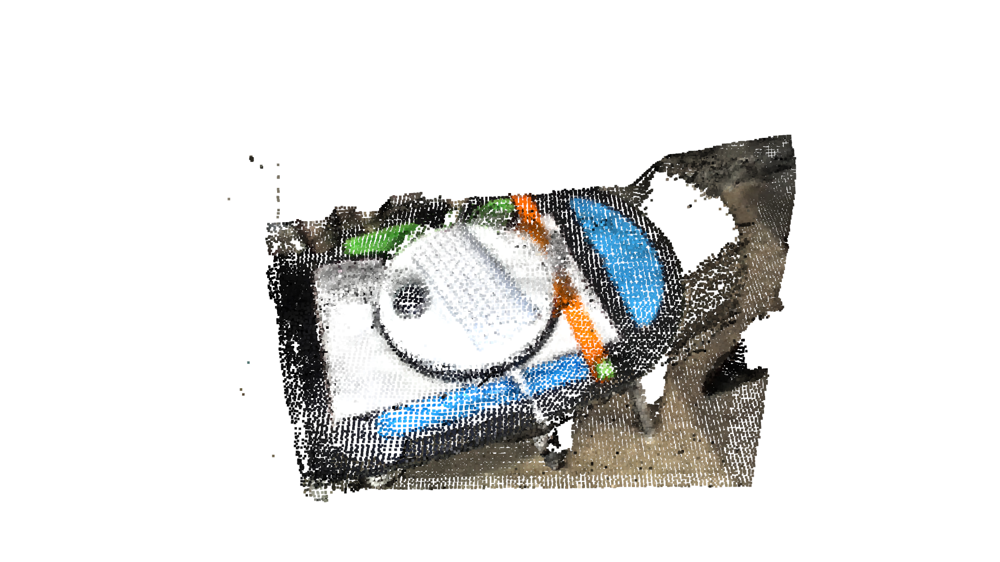

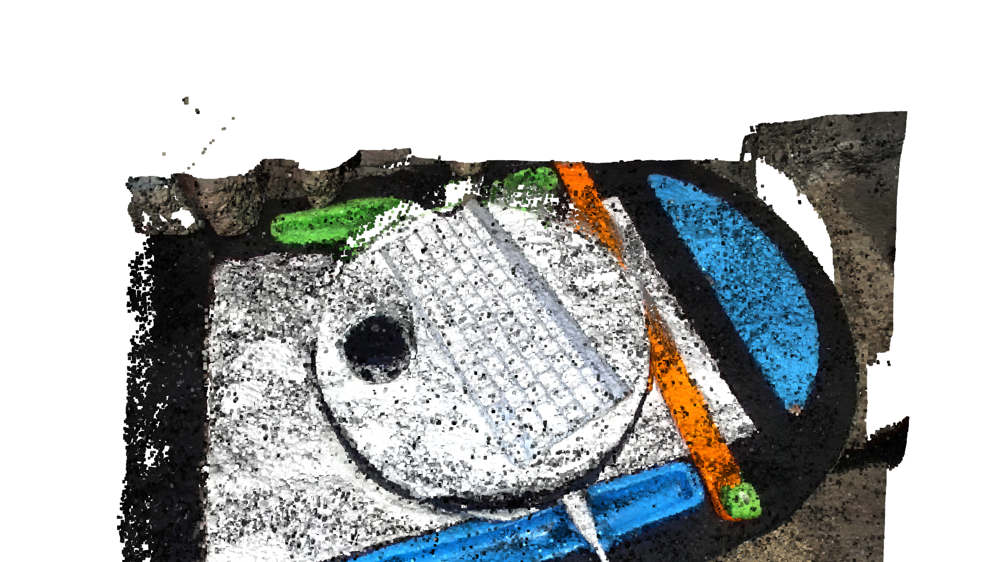

Frame num:  4
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
Using RANSAC for global registration
:: RANSAC registration on downsampled point clouds.
   Since the downsampling voxel size is 0.010,
   we use a liberal distance threshold 0.015.
RegistrationResult with fitness=4.110787e-02, inlier_rmse=9.004864e-03, and correspondence_set size of 141
Access transformation to get result.


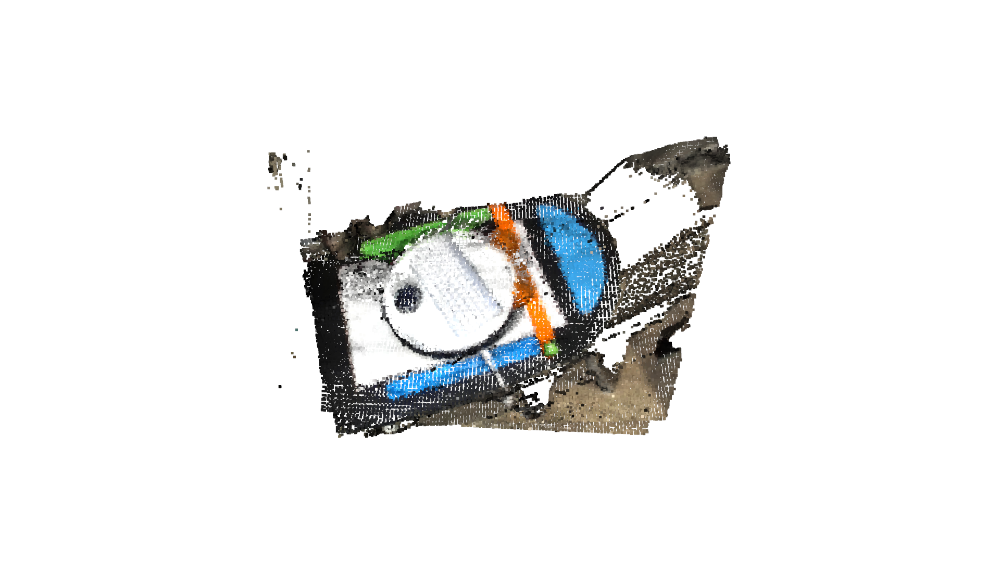

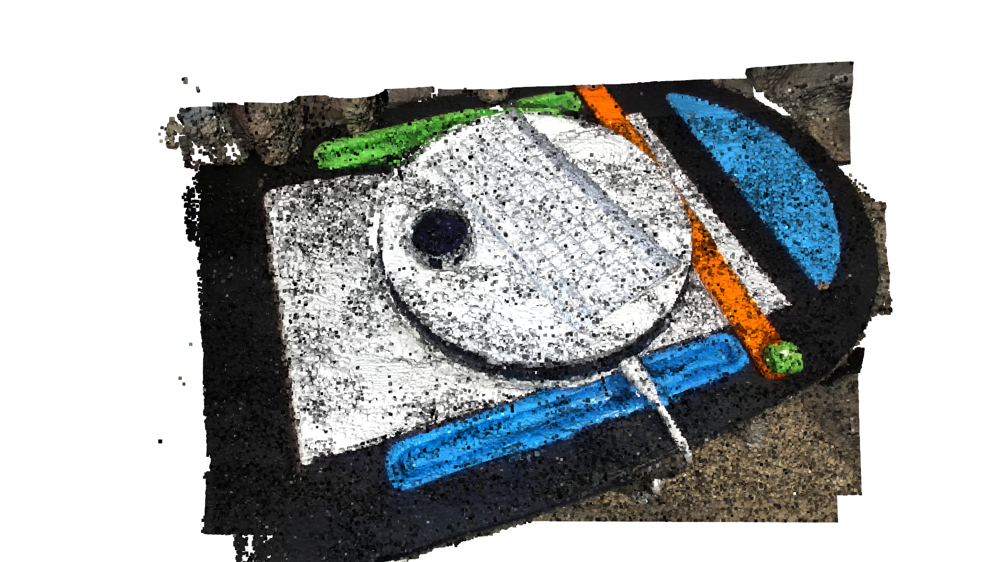

Frame num:  5
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
Using RANSAC for global registration
:: RANSAC registration on downsampled point clouds.
   Since the downsampling voxel size is 0.010,
   we use a liberal distance threshold 0.015.
RegistrationResult with fitness=5.801922e-02, inlier_rmse=9.657808e-03, and correspondence_set size of 157
Access transformation to get result.


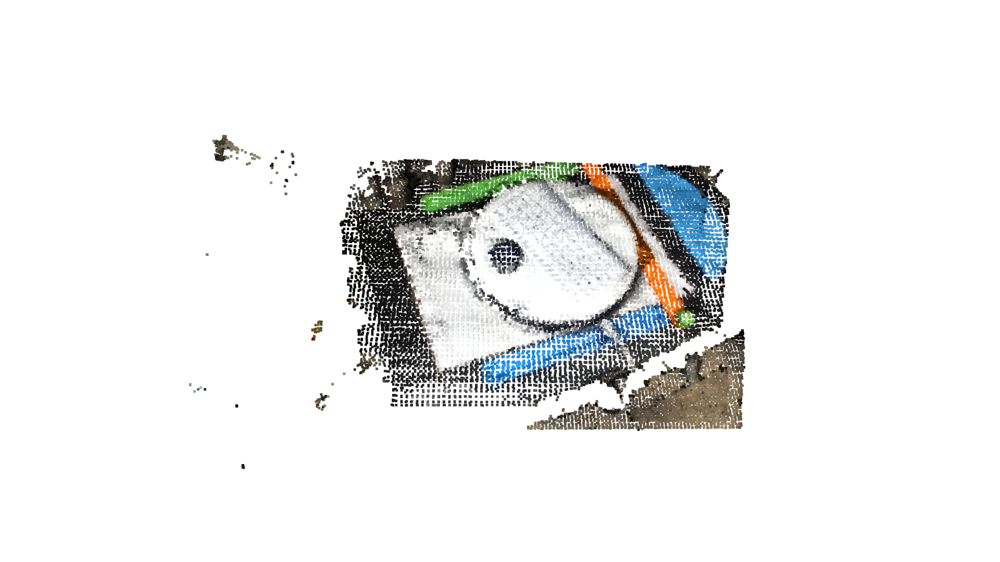

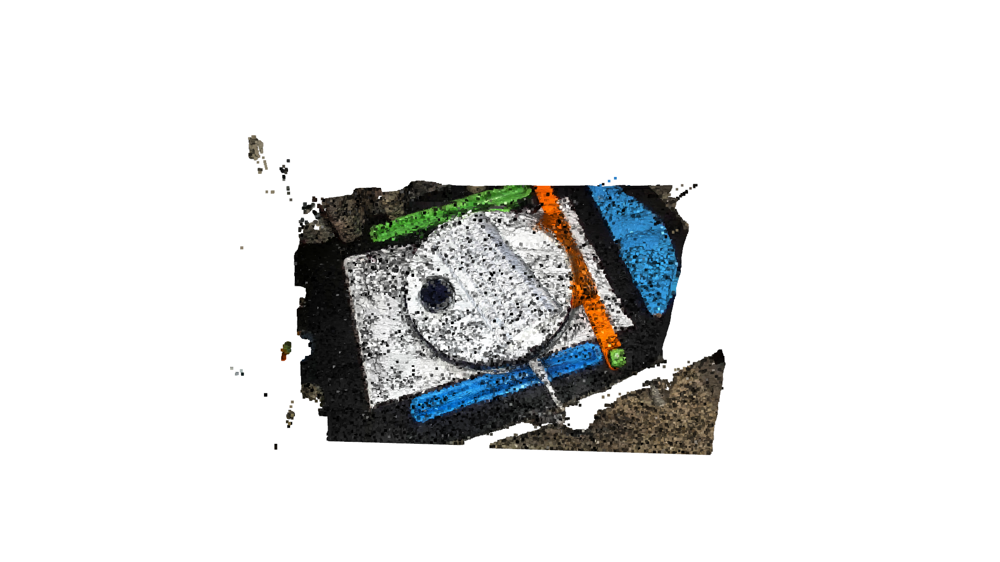

Frame num:  6
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
Using RANSAC for global registration
:: RANSAC registration on downsampled point clouds.
   Since the downsampling voxel size is 0.010,
   we use a liberal distance threshold 0.015.
RegistrationResult with fitness=1.157935e-01, inlier_rmse=8.998398e-03, and correspondence_set size of 305
Access transformation to get result.


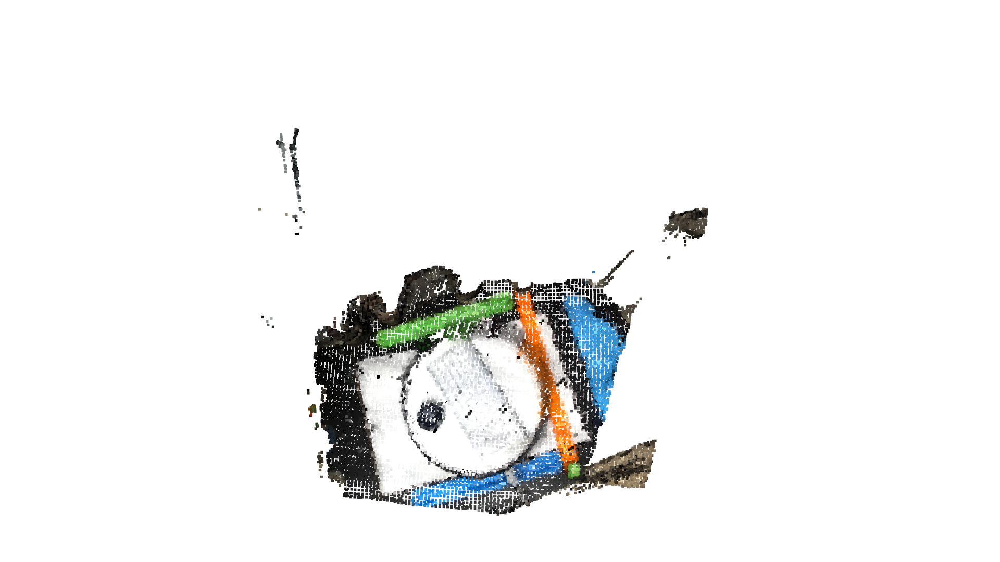

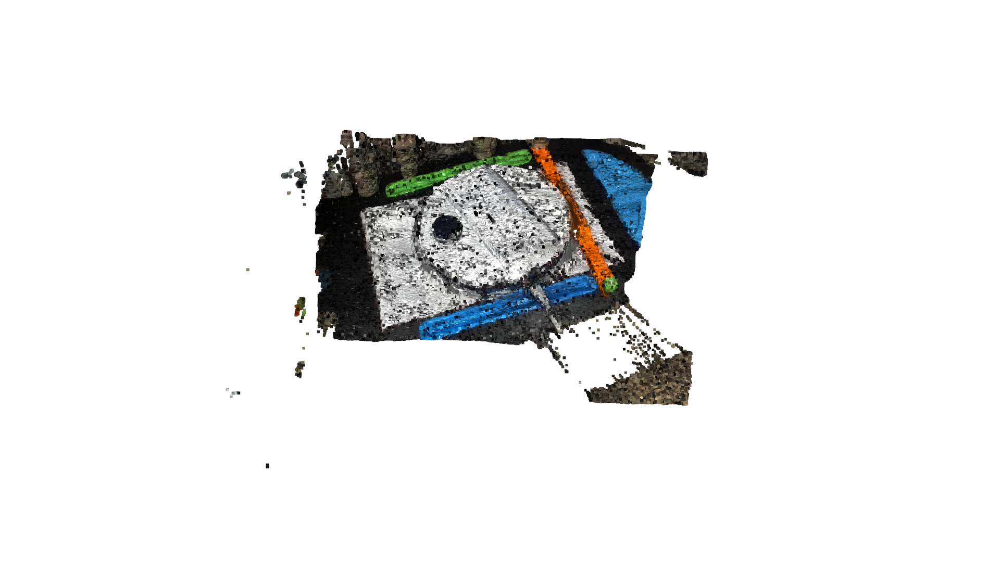

Frame num:  7
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
:: Downsample with a voxel size 0.010.
:: Estimate normal with search radius 0.020.
:: Compute FPFH feature with search radius 0.050.
Using RANSAC for global registration
:: RANSAC registration on downsampled point clouds.
   Since the downsampling voxel size is 0.010,
   we use a liberal distance threshold 0.015.
RegistrationResult with fitness=5.791191e-02, inlier_rmse=9.929756e-03, and correspondence_set size of 142
Access transformation to get result.


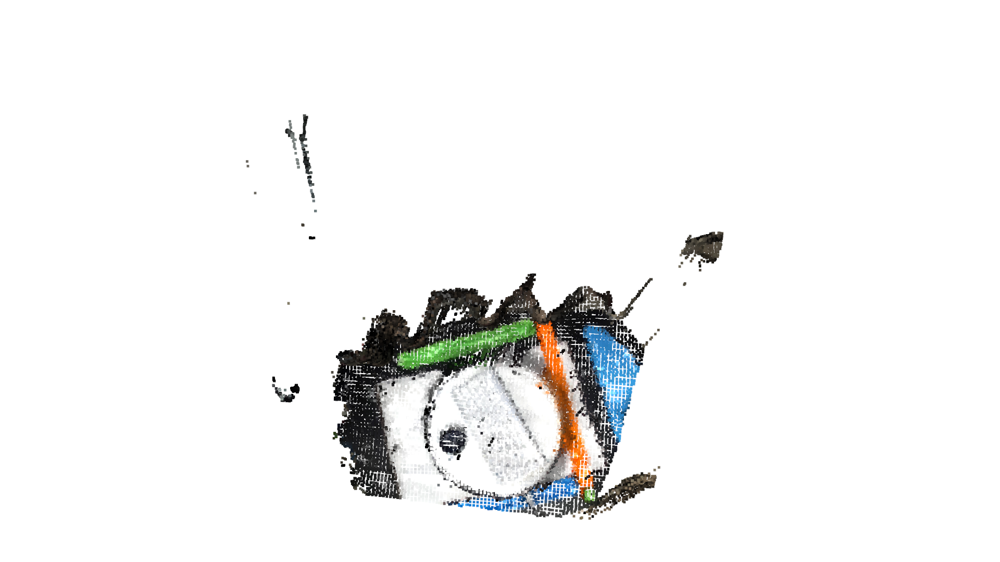

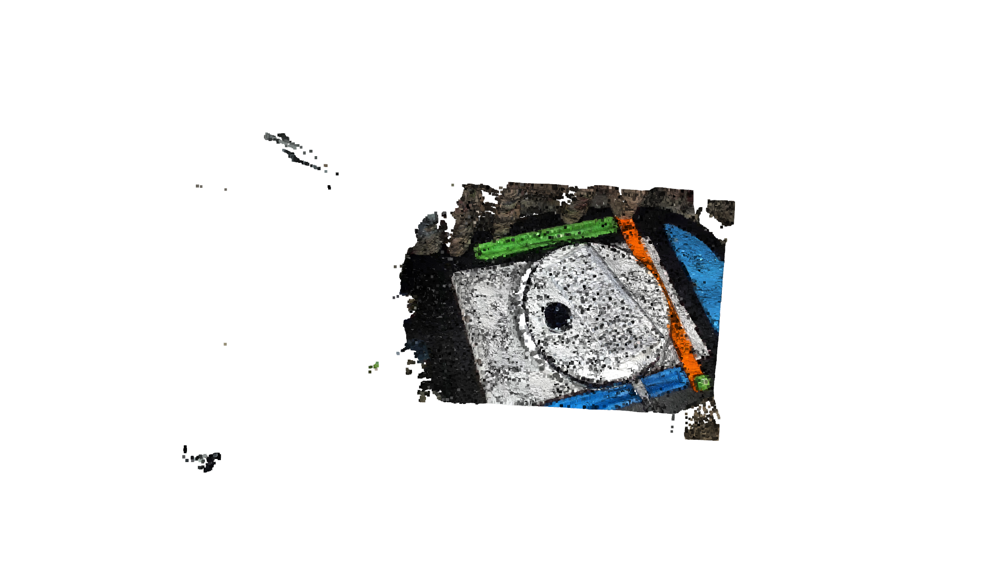

In [111]:
 
#==============================================================================
##=============##               /ODOMETRY/  ICP               ##=============## 
#==============================================================================

# Instead of using Odometry, which is not accurate, we use ICP
# to find transformation of one frame into the next frame

num_of_poses    = len(frames_nums)
print("num_of_poses:", num_of_poses)
#  == Create a trajectory .log file: ==
#from trajectory_io import *
metadata    = [0, 0, 0]
traj        = []
transform_0   = np.identity(4) # The first pose is the reference - we save identity transform matrix
traj.append(CameraPose(metadata, transform_0))

trunc       = 3 #np.inf  # Maximum depth limit.
        
for i in range(num_of_poses-1): 
    # SOURCE frame:
    print("Frame num: ", frames_nums[i])
    color_source = o3d.io.read_image(Root_path+"/%s/%06d.jpg"%('image2', frames_nums[i]))
    depth_source = o3d.io.read_image(Root_path+"/%s/%06d.png"%('depth', frames_nums[i]))
    
    rgbd_source = o3d.geometry.RGBDImage.create_from_color_and_depth(
            color_source, depth_source, 
            depth_trunc=trunc, # truncate the depth at z  =
            convert_rgb_to_intensity=False)
    source         = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_source, cameraIntrinsics)
    source_down, source_fpfh = preprocess_point_cloud(source, voxel_size)
   
    # TARGET frame:
    color_target = o3d.io.read_image(Root_path+"/%s/%06d.jpg"%('image2', frames_nums[i+1]))
    depth_target = o3d.io.read_image(Root_path+"/%s/%06d.png"%('depth', frames_nums[i+1]))
    
    rgbd_target = o3d.geometry.RGBDImage.create_from_color_and_depth(
            color_target, depth_target, 
            depth_trunc=trunc, # truncate the depth at z  =
            convert_rgb_to_intensity=False)
    
    target   = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_target, cameraIntrinsics) 
    target_down, target_fpfh = preprocess_point_cloud(target, voxel_size)
    
    #----------------Option1: Using RGBD Odemetry--------------------------
#     success_hybrid_term, trans_hybrid_term = myodometryfromRGBD(rgbd_source, rgbd_target, cameraIntrinsics)
#     if success_hybrid_term:
#         print("Using Hybrid RGB-D Odometry")
#         print(trans_hybrid_term)
#         draw_registration_result(source, target, trans_hybrid_term)#input pcd
    
    #---------------Option2: Using RANSAC-----------------------------------
    print("Using RANSAC for global registration")
    result_ransac = execute_global_registration(source_down, target_down,
                                                source_fpfh, target_fpfh, voxel_size)
    print(result_ransac)
    draw_registration_result(source_down, target_down, result_ransac.transformation)
    
    #---------------Option3: Using ICP based approach
    result_icp = refine_registration(source, target, voxel_size, result_ransac)
    draw_registration_result(source, target, result_icp.transformation)
    
    
    ## Append to camera poses:
    transform   = result_icp.transformation #trans_hybrid_term #result_icp.transformation #trans_hybrid_term 
    transform   = np.dot(transform, transform_0)
    transform_0 = transform
    traj.append(CameraPose(metadata, transform))
        

# == Generate .log file from ICP transform: ==   
write_trajectory(traj, "./0123rgbd_keyboard.log")

In [112]:
!ls

0123rgbd_keyboard.log  Open3Dcode		 keyboard.pcd
3DVisualize.ipynb      Pseudo_Lidar_V2		 kitti_object_vis
3DVisualizeV2.ipynb    SECONDinstall.ipynb	 librealsense
Argo3DVisualize.ipynb  argo_kitti_link_test.txt  myO3Dvisualizationv3.ipynb
ArgoPseudoLidar.ipynb  argoverse-api		 mynewstereo_adapter.py
Open3D		       desk.pcd			 test.txt


http://www.open3d.org/docs/latest/tutorial/Advanced/multiway_registration.html

In [156]:

frames_nums     = np.arange(3, 6, skip_N_frames)
num_of_poses    = len(frames_nums)
print("num_of_poses:", num_of_poses)
pcds = []
voxel_size = 0.02
for i in range(num_of_poses-1): 
    # SOURCE frame:
    print("Frame num: ", frames_nums[i])
    color_source = o3d.io.read_image(Root_path+"/%s/%06d.jpg"%('image2', frames_nums[i]))
    depth_source = o3d.io.read_image(Root_path+"/%s/%06d.png"%('depth', frames_nums[i]))
    
    rgbd_source = o3d.geometry.RGBDImage.create_from_color_and_depth(
            color_source, depth_source, 
            depth_trunc=trunc, # truncate the depth at z  =
            convert_rgb_to_intensity=False)
    source         = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_source, cameraIntrinsics)
    
    pcd_down = source.voxel_down_sample(voxel_size=voxel_size)
    radius_normal = voxel_size * 2
    print(":: Estimate normal with search radius %.3f." % radius_normal)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))
    pcds.append(pcd_down)
    

num_of_poses: 3
Frame num:  3
:: Estimate normal with search radius 0.040.
Frame num:  4
:: Estimate normal with search radius 0.040.


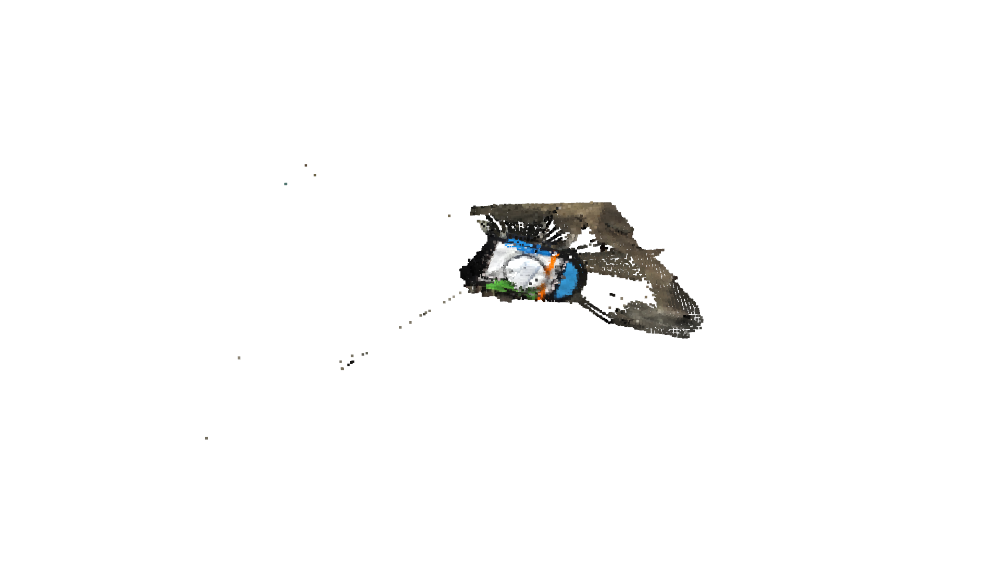

In [157]:
o3d.visualization.draw_geometries(pcds)

In [158]:
def pairwise_registration(source, target):
    print("Apply point-to-plane ICP")
    icp_coarse = o3d.pipelines.registration.registration_icp(
        source, target, max_correspondence_distance_coarse, np.identity(4),
        o3d.pipelines.registration.TransformationEstimationPointToPlane())
    icp_fine = o3d.pipelines.registration.registration_icp(
        source, target, max_correspondence_distance_fine,
        icp_coarse.transformation,
        o3d.pipelines.registration.TransformationEstimationPointToPlane())
    transformation_icp = icp_fine.transformation
    information_icp = o3d.pipelines.registration.get_information_matrix_from_point_clouds(
        source, target, max_correspondence_distance_fine,
        icp_fine.transformation)
    return transformation_icp, information_icp


def full_registration(pcds, max_correspondence_distance_coarse,
                      max_correspondence_distance_fine):
    pose_graph = o3d.pipelines.registration.PoseGraph()
    odometry = np.identity(4)
    pose_graph.nodes.append(o3d.pipelines.registration.PoseGraphNode(odometry))
    n_pcds = len(pcds)
    for source_id in range(n_pcds):
        for target_id in range(source_id + 1, n_pcds):
            transformation_icp, information_icp = pairwise_registration(
                pcds[source_id], pcds[target_id])
            print("Build o3d.pipelines.registration.PoseGraph")
            if target_id == source_id + 1:  # odometry case
                odometry = np.dot(transformation_icp, odometry)
                pose_graph.nodes.append(
                    o3d.pipelines.registration.PoseGraphNode(
                        np.linalg.inv(odometry)))
                pose_graph.edges.append(
                    o3d.pipelines.registration.PoseGraphEdge(source_id,
                                                             target_id,
                                                             transformation_icp,
                                                             information_icp,
                                                             uncertain=False))
            else:  # loop closure case
                pose_graph.edges.append(
                    o3d.pipelines.registration.PoseGraphEdge(source_id,
                                                             target_id,
                                                             transformation_icp,
                                                             information_icp,
                                                             uncertain=True))
    return pose_graph

In [159]:
voxel_size

0.02

In [160]:
print("Full registration ...")
max_correspondence_distance_coarse = voxel_size * 15
max_correspondence_distance_fine = voxel_size * 1.5
with o3d.utility.VerbosityContextManager(
        o3d.utility.VerbosityLevel.Debug) as cm:
    pose_graph = full_registration(pcds,
                                   max_correspondence_distance_coarse,
                                   max_correspondence_distance_fine)

Full registration ...
Apply point-to-plane ICP
[Open3D DEBUG] ICP Iteration #0: Fitness 1.0000, RMSE 0.0409
[Open3D DEBUG] Residual : 1.13e-03 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #1: Fitness 1.0000, RMSE 0.0251
[Open3D DEBUG] Residual : 2.85e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #2: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.26e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #3: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.17e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #4: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.14e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #5: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.14e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #6: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.14e-04 (# of elements : 5214)
[Open3D DEBUG] ICP Iteration #7: Fitness 1.0000, RMSE 0.0239
[Open3D DEBUG] Residual : 2.15e-04 (# of elements : 5214)
[

In [161]:
print("Optimizing PoseGraph ...")
option = o3d.pipelines.registration.GlobalOptimizationOption(
    max_correspondence_distance=max_correspondence_distance_fine,
    edge_prune_threshold=0.25,
    reference_node=0)
with o3d.utility.VerbosityContextManager(
        o3d.utility.VerbosityLevel.Debug) as cm:
    o3d.pipelines.registration.global_optimization(
        pose_graph,
        o3d.pipelines.registration.GlobalOptimizationLevenbergMarquardt(),
        o3d.pipelines.registration.GlobalOptimizationConvergenceCriteria(),
        option)

Optimizing PoseGraph ...
[Open3D DEBUG] Validating PoseGraph - finished.
[Open3D DEBUG] [GlobalOptimizationLM] Optimizing PoseGraph having 2 nodes and 1 edges.
[Open3D DEBUG] Line process weight : 3.988800
[Open3D DEBUG] [Initial     ] residual : 5.558713e-32, lambda : 4.432000e-02
[Open3D DEBUG] Maximum coefficient of right term < 1.000000e-06
[Open3D DEBUG] [GlobalOptimizationLM] Optimizing PoseGraph having 2 nodes and 1 edges.
[Open3D DEBUG] Line process weight : 3.988800
[Open3D DEBUG] [Initial     ] residual : 5.558713e-32, lambda : 4.432000e-02
[Open3D DEBUG] Maximum coefficient of right term < 1.000000e-06
[Open3D DEBUG] CompensateReferencePoseGraphNode : reference : 0


Transform points and display
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]
[[ 0.99943158 -0.01544556 -0.02996572 -0.01947576]
 [ 0.0165374   0.99919545  0.03653719 -0.06103152]
 [ 0.02937727 -0.03701197  0.99888292  0.03176002]
 [ 0.          0.          0.          1.        ]]


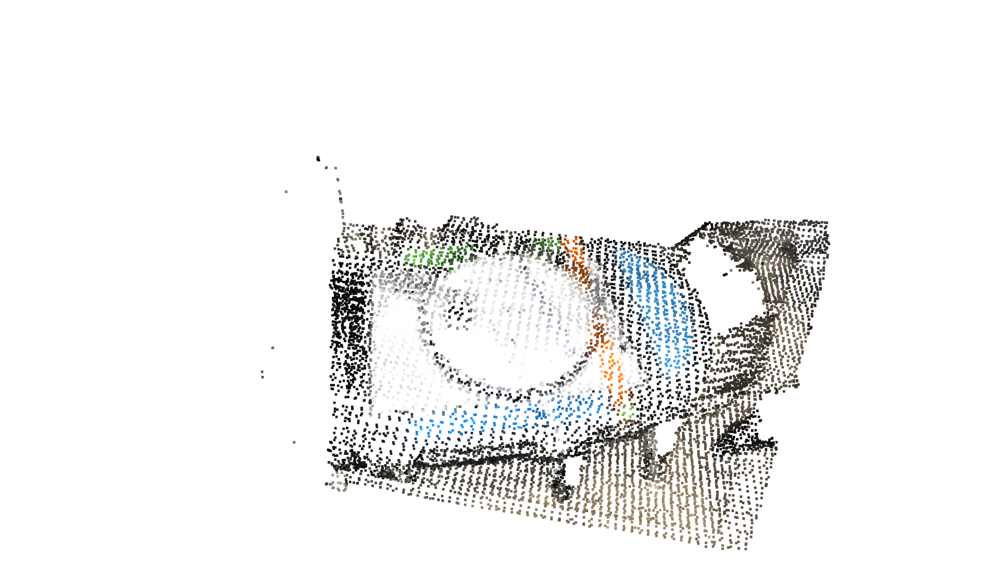

In [162]:
print("Transform points and display")
for point_id in range(len(pcds)):
    print(pose_graph.nodes[point_id].pose)
    pcds[point_id].transform(pose_graph.nodes[point_id].pose)
o3d.visualization.draw_geometries(pcds)

In [123]:
camera_poses = read_trajectory("./0123rgbd_keyboard.log")
camera_poses

In [124]:
#==============================================================================
##=============##         TSDF VOLUME INTEGRATION             ##=============## 
#==============================================================================
# ref: http://www.open3d.org/docs/latest/tutorial/Advanced/rgbd_integration.html
#  == TSDF volume integration: ==
#voxel_length: means a single voxel size for TSDF volume is 4.0 / 512.0 = 7.8125mm
#TSDFVolumeColorType.RGB8: 8 bit RGB color is also integrated as part of the TSDF volume
volume = o3d.pipelines.integration.ScalableTSDFVolume(
    voxel_length=4.0 / 512.0,
    sdf_trunc=0.04,
    color_type=o3d.pipelines.integration.TSDFVolumeColorType.RGB8)

# volume = o3d.pipelines.integration.ScalableTSDFVolume(
#     voxel_length = 0.01, # meters # ~ 1cm
#     sdf_trunc   =  0.05, # meters # ~ several voxel_lengths
#     color_type  =  o3d.pipelines.integration.TSDFVolumeColorType.RGB8)

print('\nnumber of camera_poses:', len(camera_poses),'\n')


number of camera_poses: 6 



In [125]:
for i in range(len(camera_poses)):
    print("Integrate {:d}-th image into the volume.".format(i))
    color = o3d.io.read_image(Root_path+"/%s/%06d.jpg"%('image2', i))
    depth = o3d.io.read_image(Root_path+"/%s/%06d.png"%('depth', i))
    rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(
        color, depth, depth_trunc=4, convert_rgb_to_intensity=False)
    volume.integrate(rgbd,cameraIntrinsics, np.linalg.inv(camera_poses[i].pose))
    #volume.integrate(rgbd,cameraIntrinsics, camera_poses[i].pose)

Integrate 0-th image into the volume.
Integrate 1-th image into the volume.
Integrate 2-th image into the volume.
Integrate 3-th image into the volume.
Integrate 4-th image into the volume.
Integrate 5-th image into the volume.


Extract a triangle mesh from the volume and visualize it.


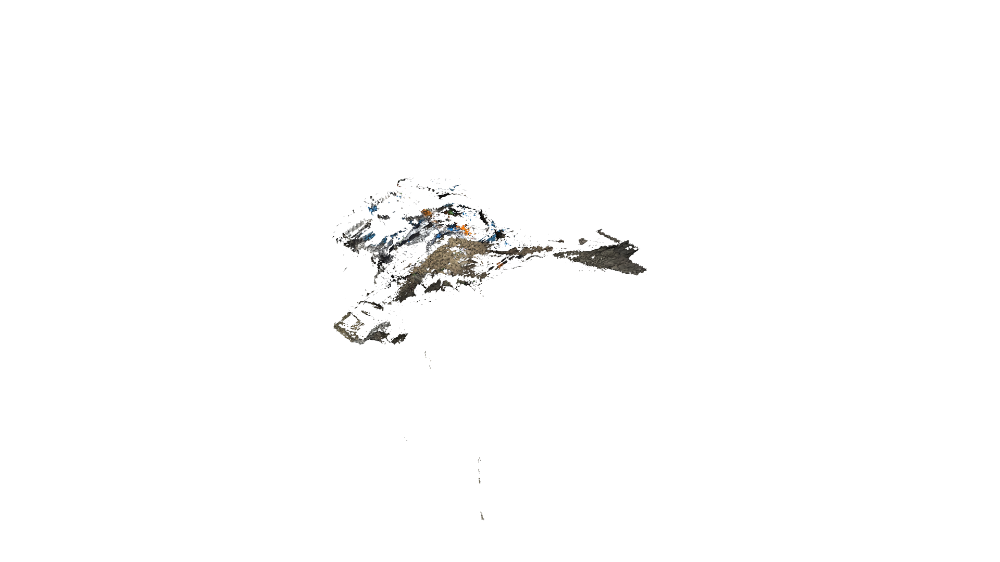

In [126]:
#==============================================================================
##=============##              TRIANGULAR MESH                ##=============## 
#==============================================================================
    
# #  == Extract a triangle mesh from the volume (with the marching cubes algorithm) 
# #     and visualize it : ==
print("Extract a triangle mesh from the volume and visualize it.")
mesh = volume.extract_triangle_mesh()
mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh],
                                  front=[0.5297, -0.1873, -0.8272],
                                  lookat=[2.0712, 2.0312, 1.7251],
                                  up=[-0.0558, -0.9809, 0.1864],
                                  zoom=0.47)
     
# mesh = volume.extract_triangle_mesh()
# print(mesh.compute_vertex_normals())

# mesh.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]]) # flip!

# o3d.visualization.draw_geometries([mesh])

In [1]:
# Save the resulting triangle mesh, load it back and visualize:

o3d.io.write_triangle_mesh('./Meshme10frames.ply', mesh)

NameError: name 'o3d' is not defined

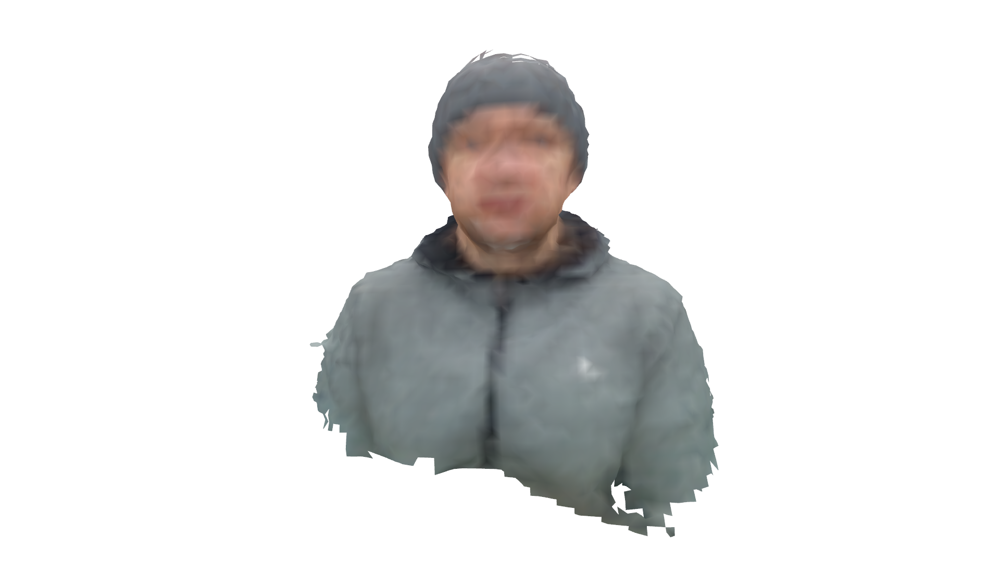

In [128]:

meshRead = o3d.io.read_triangle_mesh('./Meshme10frames.ply')
o3d.visualization.draw_geometries([meshRead])

In [129]:
!ls $Root_path

Mesh__A_hat1__every_10th_14frames.ply  main__TSDF_Integrate__depth_only.py
README.md			       readme_images
Test_data			       test_segm.log
expected_results		       trajectory_io.py
main__TSDF_Integrate__color_depth.py


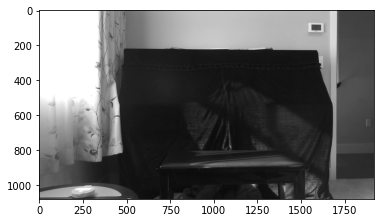

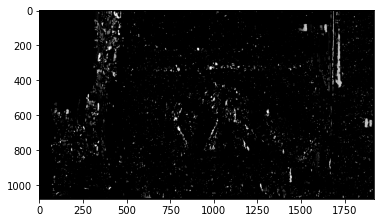

In [19]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2

imgL = cv2.imread("/DATA5T/Datasets/MyDepth/3_ZED_image_left.png",0)#load an image as a single channel grayscale 
imgR = cv2.imread("/DATA5T/Datasets/MyDepth/3_ZED_image_right.png",0)
plt.imshow(imgL,'gray')
plt.show()

stereo = cv2.StereoBM_create(numDisparities=64, blockSize=15)
disparity = stereo.compute(imgL,imgR)
plt.imshow(disparity,'gray')
plt.show()

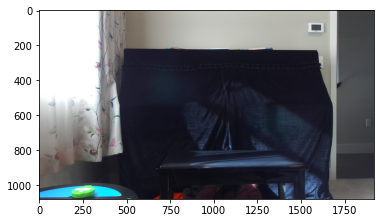

In [20]:
img_L = cv2.imread("/DATA5T/Datasets/MyDepth/3_ZED_image_left.png")
rgb_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB)
img_height, img_width, img_channel = rgb_L.shape
plt.imshow(rgb_L)

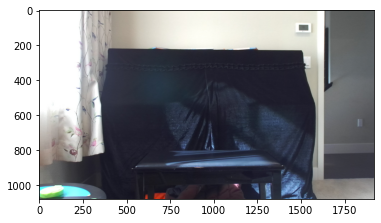

In [21]:
img_R = cv2.imread("/DATA5T/Datasets/MyDepth/3_ZED_image_right.png")
rgb_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2RGB)
plt.imshow(rgb_R)

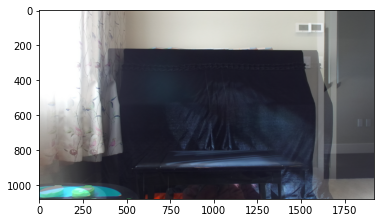

In [22]:
combined = cv2.addWeighted(rgb_L,0.5,rgb_R,0.5,0)
plt.imshow(combined)

## Geometry primitives
The code below generates a box, a sphere, and a cylinder using `create_box`, `create_sphere`, and `create_cylinder`. The box is painted in red, the sphere is painted in blue, and the cylinder is painted in green. Normals are computed for all meshes to support Phong shading (see [Visualize 3D mesh](mesh.ipynb#visualize-a-3d-mesh) and [Surface normal estimation](mesh.ipynb#surface-normal-estimation)). We can even create a coordinate axis using `create_mesh_coordinate_frame`, with its origin point set at (-2, -2, -2).

In [4]:
print("Let's define some primitives")
mesh_box = o3d.geometry.TriangleMesh.create_box(width=1.0,
                                                height=1.0,
                                                depth=1.0)
mesh_box.compute_vertex_normals()
mesh_box.paint_uniform_color([0.9, 0.1, 0.1])
mesh_sphere = o3d.geometry.TriangleMesh.create_sphere(radius=1.0)
mesh_sphere.compute_vertex_normals()
mesh_sphere.paint_uniform_color([0.1, 0.1, 0.7])
mesh_cylinder = o3d.geometry.TriangleMesh.create_cylinder(radius=0.3,
                                                          height=4.0)
mesh_cylinder.compute_vertex_normals()
mesh_cylinder.paint_uniform_color([0.1, 0.9, 0.1])
mesh_frame = o3d.geometry.TriangleMesh.create_coordinate_frame(
    size=0.6, origin=[-2, -2, -2])

Let's define some primitives


`draw_geometries` takes a list of geometries and renders them all together. Alternatively, `TriangleMesh` supports a + operator to combine multiple meshes into one. We recommend the first approach since it supports a combination of different geometries (e.g., a mesh can be rendered in tandem with a point cloud).

In [ ]:
print("We draw a few primitives using collection.")
o3d.visualization.draw_geometries(
    [mesh_box, mesh_sphere, mesh_cylinder, mesh_frame])

print("We draw a few primitives using + operator of mesh.")
o3d.visualization.draw_geometries(
    [mesh_box + mesh_sphere + mesh_cylinder + mesh_frame])

## Draw line set
To draw lines, it is necessary to define a `LineSet` with a set of points and a set of edges (pairs of point indices). The example below creates custom points and edges (denoted as `lines`) to make a box. Color is optional - red color `[1,0,0]` is assigned to each edge in this example.

In [ ]:
print("Let's draw a box using o3d.geometry.LineSet.")
points = [
    [0, 0, 0],
    [1, 0, 0],
    [0, 1, 0],
    [1, 1, 0],
    [0, 0, 1],
    [1, 0, 1],
    [0, 1, 1],
    [1, 1, 1],
]
lines = [
    [0, 1],
    [0, 2],
    [1, 3],
    [2, 3],
    [4, 5],
    [4, 6],
    [5, 7],
    [6, 7],
    [0, 4],
    [1, 5],
    [2, 6],
    [3, 7],
]
colors = [[1, 0, 0] for i in range(len(lines))]
line_set = o3d.geometry.LineSet(
    points=o3d.utility.Vector3dVector(points),
    lines=o3d.utility.Vector2iVector(lines),
)
line_set.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([line_set], zoom=0.8)